In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from torchvision.io import read_image
torch.cuda.empty_cache()

from math import exp
import csv
import glob
from PIL import Image
import tensorflow as tf

from torch.utils.tensorboard import SummaryWriter 

import warnings
warnings.filterwarnings("ignore")

In [2]:
!unzip /content/drive/MyDrive/thesis/CASIA-WebFace.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
 extracting: CASIA-WebFace/5037351/021.jpg  
 extracting: CASIA-WebFace/5037351/022.jpg  
 extracting: CASIA-WebFace/5037351/023.jpg  
 extracting: CASIA-WebFace/5037351/024.jpg  
 extracting: CASIA-WebFace/5037351/025.jpg  
 extracting: CASIA-WebFace/5037351/026.jpg  
 extracting: CASIA-WebFace/5037351/027.jpg  
 extracting: CASIA-WebFace/5037351/028.jpg  
 extracting: CASIA-WebFace/5037351/029.jpg  
   creating: CASIA-WebFace/5037999/
 extracting: CASIA-WebFace/5037999/001.jpg  
 extracting: CASIA-WebFace/5037999/002.jpg  
 extracting: CASIA-WebFace/5037999/003.jpg  
 extracting: CASIA-WebFace/5037999/004.jpg  
 extracting: CASIA-WebFace/5037999/005.jpg  
 extracting: CASIA-WebFace/5037999/006.jpg  
 extracting: CASIA-WebFace/5037999/007.jpg  
 extracting: CASIA-WebFace/5037999/008.jpg  
 extracting: CASIA-WebFace/5037999/009.jpg  
 extracting: CASIA-WebFace/5037999/010.jpg  
 extracting: CASIA-WebFace/5037999/011.jp

In [3]:
# !gdown --id 1Of_EVz-yHV7QVWQGihYfvtny9Ne8qXVz -O CASIA-WebFace.zip
# !unzip /content/CASIA-WebFace.zip
# !rm /content/CASIA-WebFace.zip

In [4]:
row = []
data = []

labels_paths = glob.glob('/content/CASIA-WebFace/' + '*')
n_labels = len(labels_paths)

for i in range(n_labels):
  for j in range(len(glob.glob(labels_paths[i] + '/*.jpg'))):
    data.append([glob.glob(labels_paths[i] + '/*.jpg')[j], labels_paths[i].split('/')[-1]])


In [5]:
sample_data = data[:100000]
len(sample_data)

with open('sample_data.csv', 'w') as sample_f:
  writer = csv.writer(sample_f)
  writer.writerow(['image', 'label'])
  writer.writerows(sample_data)

In [6]:
with open('data.csv', 'w') as f:
  writer = csv.writer(f)
  writer.writerow(['image', 'label'])
  writer.writerows(data)

In [7]:
df = pd.read_csv('/content/data.csv')
df = df.sample(frac=1)
df.head()
print(len(df))

494414


In [8]:
sample = df.iloc[:10000]
len(sample)

10000

torch.Size([3, 250, 250])


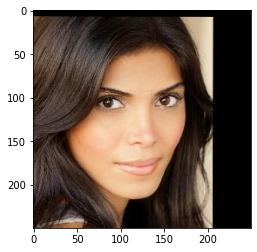

In [9]:
# df.loc[0][0]
# read_image(df.loc[0][0])
plt.imshow(read_image(df.loc[0][0]).permute(1, 2, 0))
print(read_image(df.loc[0][0]).shape)

In [10]:
class CasiaDataset(Dataset):
  def __init__(self, 
               imgs_path,
               csv_file,
               transform
               ):
    self.imgs_path = imgs_path
    self.data = pd.read_csv(csv_file)
    self.transform = transform

  def __len__(self):
    return len(self.data)

  def __getitem__(self, index):
    self.data = self.data.sample(frac=1)
    
    # image = read_image(self.data.iloc[index, 0])
    image = Image.open(self.data.iloc[index, 0])
    label = self.data.iloc[index, 1]

    if self.transform:
      image = self.transform(image)

    return image, label

In [11]:
transform = T.Compose([
                       T.Resize((128, 128)), 
                      #  T.RandomCrop(224),
                       T.RandomHorizontalFlip(),
                       T.Grayscale(),
                       T.ToTensor()
                       ])

my_dataset = CasiaDataset('/content/CASIA-WebFace/',
                          '/content/data.csv',
                          transform)

loader = DataLoader(my_dataset, 
                    batch_size=20, 
                    shuffle=False)

sample_dataset = CasiaDataset('/content/CASIA-WebFace/',
                          '/content/sample_data.csv',
                          transform)

sample_loader = DataLoader(sample_dataset, 
                    batch_size=20, 
                    shuffle=False)

In [28]:
# plt.imshow(images[1].permute(1, 2, 0))
# print(images[1].shape)

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## cGAN

In [13]:
class BlockDiscriminator(nn.Module):
  def __init__(self, in_ch, out_ch, stride, type):
    super(BlockDiscriminator, self).__init__()
    if type == 1:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=2)
      )
    elif type == 2:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=3, stride = stride, padding = 1),
          nn.BatchNorm2d(out_ch),
          nn.LeakyReLU()
      )
    else:
      self.block_disc = nn.Sequential(
          nn.Conv2d(in_ch, out_ch, kernel_size=3, stride = stride),
          nn.LeakyReLU()
      )
  
  def forward(self, input):
    return self.block_disc(input)

In [15]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.disc = nn.ModuleList([
                               BlockDiscriminator(1, 1, 2, type=1),
                               BlockDiscriminator(1, 1, 2, type=2),
                               BlockDiscriminator(1, 1, 2, type=2),
                               BlockDiscriminator(1, 1, 1, type=2),
                               BlockDiscriminator(1, 1, 1, type=3),
                               nn.Sigmoid()
    ])
  
  def forward(self, input):
    for layer in self.disc:
      output = layer(input)
      input = output
    return output


In [16]:
# Encoder as U-Net
class Enc_block(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(Enc_block, self).__init__()
    self.enc_block = nn.Sequential(
        nn.Conv2d(in_ch, out_ch, kernel_size = 4, stride = 2, padding = 1),
        nn.BatchNorm2d(out_ch),
        nn.LeakyReLU(inplace=True),
    )

  def forward(self, input):
    return self.enc_block(input)
  

In [ ]:
class Dec_block(nn.Module):
  def __init__(self, in_ch, out_ch):
    super(Dec_block, self).__init__()
    self.dec_block = nn.Sequential(
        nn.ConvTranspose2d(in_ch, out_ch, kernel_size = 4, stride = 2, padding = 1),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(inplace=True),
    )

  def forward(self, input):
    return self.dec_block(input)

In [ ]:
class Unet(nn.Module):
  def __init__(self, in_ch = 1, out_ch = 1, features=[4, 8, 16, 32, 64, 128]):
    super(Unet, self).__init__()
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    self.downs = nn.ModuleList([
                                Enc_block(1, 8),
                                Enc_block(8, 16),
                                Enc_block(16, 32),
                                Enc_block(32, 64),
                                Enc_block(64, 128),
                                nn.Sequential(
                                    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1), 
                                    nn.LeakyReLU(),
                                )                                
    ])

    self.ups = nn.ModuleList([
                              nn.Sequential(
                                  nn.ConvTranspose2d(512, 128, kernel_size=3),
                                  nn.BatchNorm2d(128),
                                  nn.Dropout(0.5),
                                  nn.ReLU(inplace=True)),
                              Dec_block(256, 64),
                              Dec_block(128, 32),
                              Dec_block(64, 16),
                              Dec_block(32, 8),
                              nn.Sequential(
                                  nn.ConvTranspose2d(16, 4, kernel_size=4, stride=2, padding=2),
                                  nn.BatchNorm2d(4),
                              )
    ])
    
    self.bottleneck = nn.Sequential(
        nn.ConvTranspose2d(256, 256, kernel_size=4, padding=1),
        nn.BatchNorm2d(256),
        nn.Dropout(0.5),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(2)
    )

    self.final_conv = nn.Sequential(
        nn.ConvTranspose2d(4, 1, kernel_size=3),
        nn.ReLU(inplace=True),
    )

  def forward(self, input):
    skip_connections = []
    for down in self.downs:
      input = down(input)
      skip_connections.append(input)
    

    input = self.bottleneck(input)
    skip_connections = skip_connections[::-1] ### reversed list
    
    skip_connections_shape = []
    for i in skip_connections:
      skip_connections_shape.append(i.shape)

    for idx in range(0, len(self.ups), 1):
      skip_connection = skip_connections[idx]
      if input.shape != skip_connection.shape:
        input = TF.resize(input, size = skip_connection.shape[2:])
      concat_skip = torch.cat((skip_connection, input), dim = 1)
      input = self.ups[idx](concat_skip)
      
    return self.final_conv(input)

## Face verification

In [16]:
class mfm(nn.Module):
  def __init__(self, in_ch, out_ch, kernel_size = 3, stride = 1, padding = 1, type=1):
    super().__init__()
    self.out_ch = out_ch
    if type == 1:
      self.filter = nn.Conv2d(in_ch, 2 * out_ch, kernel_size, stride, padding)
    else:
      self.filter = nn.Linear(in_ch, 2 * out_ch)
  def forward(self, input):
    input = self.filter(input)
    output = torch.split(input, self.out_ch, 1)
    return torch.max(output[0], output[1])

class group(nn.Module):
  def __init__(self, in_ch, out_ch, kernel_size, stride, padding):
    super().__init__()
    self.conv_a = mfm(in_ch, in_ch, 1, 1, 0)
    self.conv = mfm(in_ch, out_ch, kernel_size, stride, padding)
  def forward(self, input):
    input = self.conv_a(input)
    output = self.conv(input)
    return output

class network_9layers(nn.Module):
  def __init__(self):
    super(network_9layers, self).__init__()
    self.features = nn.Sequential(
        mfm(1, 48, 5, 1, 2), 
        nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True), 
        group(48, 96, 3, 1, 1), 
        nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True),
        group(96, 192, 3, 1, 1),
        nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True), 
        group(192, 128, 3, 1, 1),
        group(128, 128, 3, 1, 1),
        nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True),
        )
    self.fc1 = mfm(8*8*128, 256, type=0)
    self.fc2 = nn.Linear(256, 256)

    self.fc3 = nn.Linear(512, 256)
    self.fc4 = nn.Linear(256, 1)

  def forward_once(self, input):

    input = self.features(input)
    input = input.view(input.size(0), -1)
    input = self.fc1(input)
    input = F.dropout(input, training=self.training)
    output = self.fc2(input)
    return output

  def forward(self, input1, input2):
    output1 = self.forward_once(input1)
    output2 = self.forward_once(input2)
    return output1, output2



In [17]:
class ContrastiveLoss(nn.Module):
  def __init__(self, margin):
    super().__init__()
    self.margin = margin
  def forward(self, img0, img1, label):
    euclidean_distance = F.pairwise_distance(img0, img1)
    loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) + (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))
    return loss_contrastive


In [19]:
model = network_9layers()
criterion = ContrastiveLoss(margin=2.0)
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
num_epoch = 10

In [ ]:
from torch.autograd import Variable

counter = []
loss_history = [] 
iteration_number = 0

for epoch in range(0, num_epoch):
  for i, data in enumerate(dataloader, 0):
    img0, img1 , label = data
    img0, img1 = img0.float(), img1.float()
    
    output1, output2 = model(img0, img1)
    optimizer.zero_grad()
    loss_contrastive = criterion(output1, output2, label)
    loss_contrastive.backward()
    optimizer.step()

    if i % 10 == 0 :
      print("Epoch number {}\n Current loss {}\n".format(epoch, loss_contrastive))
      iteration_number +=10
      counter.append(iteration_number)
      loss_history.append(loss_contrastive)

## SSIM

In [14]:


def gaussian(window_size, sigma):
  gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
  return gauss/gauss.sum()

def create_window(window_size, channel=1):
  _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
  _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
  window = _2D_window.expand(channel, 1, window_size, window_size).contiguous()
  return window

def ssim(img1, img2, window_size=11, window=None, size_average=True, full=False, val_range=None):
  # Value range can be different from 255. Other common ranges are 1 (sigmoid) and 2 (tanh).
  if val_range is None:
    if torch.max(img1) > 128:
      max_val = 255
    else:
      max_val = 1

    if torch.min(img1) < -0.5:
      min_val = -1
    else:
      min_val = 0
    L = max_val - min_val
  else:
    L = val_range

  padd = 0
  (_, channel, height, width) = img1.size()
  if window is None:
    real_size = min(window_size, height, width)
    window = create_window(real_size, channel=channel).to(img1.device)

  mu1 = F.conv2d(img1, window, padding=padd, groups=channel)
  mu2 = F.conv2d(img2, window, padding=padd, groups=channel)

  mu1_sq = mu1.pow(2)
  mu2_sq = mu2.pow(2)
  mu1_mu2 = mu1 * mu2

  sigma1_sq = F.conv2d(img1 * img1, window, padding=padd, groups=channel) - mu1_sq
  sigma2_sq = F.conv2d(img2 * img2, window, padding=padd, groups=channel) - mu2_sq
  sigma12 = F.conv2d(img1 * img2, window, padding=padd, groups=channel) - mu1_mu2

  C1 = (0.01 * L) ** 2
  C2 = (0.03 * L) ** 2

  v1 = 2.0 * sigma12 + C2
  v2 = sigma1_sq + sigma2_sq + C2
  cs = v1 / v2  # contrast sensitivity

  ssim_map = ((2 * mu1_mu2 + C1) * v1) / ((mu1_sq + mu2_sq + C1) * v2)

  if size_average:
    cs = cs.mean()
    ret = ssim_map.mean()
  else:
    cs = cs.mean(1).mean(1).mean(1)
    ret = ssim_map.mean(1).mean(1).mean(1)

  if full:
    return ret, cs
  return ret

In [15]:
# Classes to re-use window
class SSIM(torch.nn.Module):
  def __init__(self, window_size=11, size_average=True, val_range=None):
    super(SSIM, self).__init__()
    self.window_size = window_size
    self.size_average = size_average
    self.val_range = val_range

    # Assume 1 channel for SSIM
    self.channel = 1
    self.window = create_window(window_size)

  def forward(self, img1, img2):
    (_, channel, _, _) = img1.size()

    if channel == self.channel and self.window.dtype == img1.dtype:
      window = self.window
    else:
      window = create_window(self.window_size, channel).to(img1.device).type(img1.dtype)
      self.window = window
      self.channel = channel

    return ssim(img1, img2, window=window, window_size=self.window_size, size_average=self.size_average)

In [ ]:
siim_model = SSIM().to(device)
discriminator = Discriminator().to(device)
generator = Unet().to(device)

criterion_gan = nn.BCELoss()
D_opt = torch.optim.Adam(discriminator.parameters(), lr = 0.002)
G_opt = torch.optim.Adam(generator.parameters(), lr = 0.002)

In [ ]:
criterion_ver = 
criterion_sim = 

In [ ]:
# !nvidia-smi

In [ ]:
lr = 3e-4
batch_size = 20
num_epochs = 10
n_noise = 512
n_critic = 1

fixed_noise = torch.randn(batch_size, 1, 128, 128).to(device)

D_labels = torch.ones(batch_size, 1, 30, 30).to(device)
D_fakes = -torch.ones(batch_size, 1, 30, 30).to(device)


In [ ]:
# tensorboard
!pip uninstall -q tensorboard tb-nightly
!pip install -U tb-nightly
%load_ext tensorboard

Proceed (y/n)? y
     |████████████████████████████████| 5.8 MB 5.1 MB/s 


In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
G_losses = []
D_losses = []

writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")

for epoch in range(num_epochs):
  for idx, (images, _) in enumerate(sample_loader):
    step = 0

    # Training Discriminator
    x = images.to(device)
    x_outputs = discriminator(x)
    D_x_loss = criterion(x_outputs, D_labels)
    
    z = torch.randn(batch_size, 1, 128, 128).to(device)
    # print(type(z))
    # generator.cuda()
    # discriminator.cuda()
    z_outputs = discriminator(generator(z))
    D_z_loss = criterion(z_outputs, D_fakes)
    D_loss = D_x_loss + D_z_loss
    # print(D_loss.shape)
    
    D_opt.zero_grad()
    D_loss.backward()
    D_opt.step()

    # if step % n_critic == 0:

    # Training Generator
    z = torch.randn(batch_size, 1, 128, 128).to(device)
    z_outputs = discriminator(generator(z))
    G_loss = criterion(z_outputs, D_labels)
    # print(G_loss.shape)

    G_opt.zero_grad()
    G_loss.backward()
    G_opt.step()

    if idx == 0:
      print(f"Epoch [{epoch}/{num_epochs}] Batch {idx}/{len(sample_loader)} \
                Loss D: {D_loss:.4f}, loss G: {G_loss:.4f}"
      )

      with torch.no_grad():
        fake_i = generator(fixed_noise).reshape(-1, 1, 128, 128)
        data_i = images.reshape(-1, 1, 128, 128)
        img_grid_fake = torchvision.utils.make_grid(fake_i, normalize=True)
        img_grid_real = torchvision.utils.make_grid(data_i, normalize=True)

        writer_fake.add_image("Fake Images", img_grid_fake, global_step=step)
        writer_real.add_image("Real Images", img_grid_real, global_step=step)
        step += 1
    
    # if step % 50 == 0:
    #   print('Epoch: {}/{}, Step: {}, D Loss: {}, G Loss: {}'.format(epoch, num_epochs, step, D_loss.item(), G_loss.item()))
    #   D_losses.append(D_loss.item())
    #   G_losses.append(G_loss.item())
    
    # step += 1

Epoch [0/10] Batch 0/5000                 Loss D: 1.4654, loss G: 0.6696
Epoch [1/10] Batch 0/5000                 Loss D: 0.0723, loss G: 3.4459
Epoch [2/10] Batch 0/5000                 Loss D: 0.0021, loss G: 7.2683
Epoch [3/10] Batch 0/5000                 Loss D: -0.0009, loss G: 12.1338
Epoch [4/10] Batch 0/5000                 Loss D: 0.0001, loss G: 12.4819
Epoch [5/10] Batch 0/5000                 Loss D: -4.4607, loss G: 21.5646
Epoch [6/10] Batch 0/5000                 Loss D: 0.1034, loss G: 27.8523
Epoch [7/10] Batch 0/5000                 Loss D: 0.0005, loss G: 27.1677
Epoch [8/10] Batch 0/5000                 Loss D: -0.0000, loss G: 27.4919
Epoch [9/10] Batch 0/5000                 Loss D: 0.0012, loss G: 28.1560


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

---

In [ ]:
def gaussian(window_size, sigma):
  gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
  return gauss/gauss.sum()

In [ ]:
def create_window(window_size, channel=1):
  _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
  _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
  window = _2D_window.expand(channel, 1, window_size, window_size).contiguous()
  return window

In [ ]:
def ssim(img1, img2, window_size=11, window=None, size_average=True, full=False, val_range=None):
  # Value range can be different from 255. Other common ranges are 1 (sigmoid) and 2 (tanh).
  if val_range is None:
    if torch.max(img1) > 128:
      max_val = 255
    else:
      max_val = 1

    if torch.min(img1) < -0.5:
      min_val = -1
    else:
      min_val = 0
    L = max_val - min_val
  else:
    L = val_range

  padd = 0
  (_, channel, height, width) = img1.size()
  if window is None:
    real_size = min(window_size, height, width)
    window = create_window(real_size, channel=channel).to(img1.device)

  mu1 = F.conv2d(img1, window, padding=padd, groups=channel)
  mu2 = F.conv2d(img2, window, padding=padd, groups=channel)

  mu1_sq = mu1.pow(2)
  mu2_sq = mu2.pow(2)
  mu1_mu2 = mu1 * mu2

  sigma1_sq = F.conv2d(img1 * img1, window, padding=padd, groups=channel) - mu1_sq
  sigma2_sq = F.conv2d(img2 * img2, window, padding=padd, groups=channel) - mu2_sq
  sigma12 = F.conv2d(img1 * img2, window, padding=padd, groups=channel) - mu1_mu2

  C1 = (0.01 * L) ** 2
  C2 = (0.03 * L) ** 2

  v1 = 2.0 * sigma12 + C2
  v2 = sigma1_sq + sigma2_sq + C2
  cs = v1 / v2  # contrast sensitivity

  ssim_map = ((2 * mu1_mu2 + C1) * v1) / ((mu1_sq + mu2_sq + C1) * v2)

  if size_average:
    cs = cs.mean()
    ret = ssim_map.mean()
  else:
    cs = cs.mean(1).mean(1).mean(1)
    ret = ssim_map.mean(1).mean(1).mean(1)

  if full:
    return ret, cs
  return ret

In [ ]:
# Classes to re-use window
class SSIM(torch.nn.Module):
  def __init__(self, window_size=11, size_average=True, val_range=None):
    super(SSIM, self).__init__()
    self.window_size = window_size
    self.size_average = size_average
    self.val_range = val_range

    # Assume 1 channel for SSIM
    self.channel = 1
    self.window = create_window(window_size)

  def forward(self, img1, img2):
    (_, channel, _, _) = img1.size()

    if channel == self.channel and self.window.dtype == img1.dtype:
      window = self.window
    else:
      window = create_window(self.window_size, channel).to(img1.device).type(img1.dtype)
      self.window = window
      self.channel = channel

    return ssim(img1, img2, window=window, window_size=self.window_size, size_average=self.size_average)

In [ ]:
ssim_model = SSIM()

---